In [1]:
# Note: some of the code are copied from Kaggle's lessons

# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
from scipy import signal
# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('./'):
    for filename in filenames:
#         print(os.path.join(dirname, filename))
        pass

# You can write up to 5GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

In [2]:
from sklearn.model_selection import train_test_split

from sklearn.metrics import mean_absolute_error
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import OneHotEncoder
from sklearn.feature_selection import SelectFromModel
from sklearn.neural_network import MLPRegressor

from sklearn.ensemble import RandomForestRegressor
from xgboost import XGBRegressor
import lightgbm as lgb

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras import callbacks

import matplotlib as mpl
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns

gpus = tf.config.experimental.list_physical_devices('GPU')
if gpus:
  # Restrict TensorFlow to only allocate 1GB of memory on the first GPU
    try:
        tf.config.experimental.set_virtual_device_configuration(
            gpus[0],
            [tf.config.experimental.VirtualDeviceConfiguration(memory_limit=1024*5)])
        logical_gpus = tf.config.experimental.list_logical_devices('GPU')
        print(len(gpus), "Physical GPUs,", len(logical_gpus), "Logical GPUs")
    except RuntimeError as e:
        # Virtual devices must be set before GPUs have been initialized
        print(e)

1 Physical GPUs, 1 Logical GPUs


In [3]:
# Files 
GSPC_path='./data/^GSPC.csv'
can_unemp_path='./data/can_unempemp.csv'
us_unemp_path='./data/us_UNRATE.csv'
DJI_path='./data/^DJI.csv'
FVX_path='./data/^FVX.csv'
GSPTSE_path='./data/^GSPTSE.csv'
IRX_path='./data/^IRX.csv'
IXIC_path='./data/^IXIC.csv'
N225_path='./data/^N225.csv'
TNX_path='./data/^TNX.csv'
TYX_path='./data/^TYX.csv'
usGDP_path='./data/usGDP.csv'
non_farm_path='./data/non_farm.csv'
us_CPI_path='./data/OECD_CPI_Total_All_Items.csv'

In [4]:
GSPC = pd.read_csv(GSPC_path, index_col='Date',parse_dates=True)
can_unemp = pd.read_csv(can_unemp_path, index_col='Date',parse_dates=True)
us_unemp = pd.read_csv(us_unemp_path, index_col='DATE',parse_dates=True)

DJI = pd.read_csv(DJI_path, index_col='Date',parse_dates=True)
FVX = pd.read_csv(FVX_path, index_col='Date',parse_dates=True)
GSPTSE = pd.read_csv(GSPTSE_path, index_col='Date',parse_dates=True)
IRX = pd.read_csv(IRX_path, index_col='Date',parse_dates=True)
IXIC = pd.read_csv(IXIC_path, index_col='Date',parse_dates=True)
N225 = pd.read_csv(N225_path, index_col='Date',parse_dates=True)
TNX = pd.read_csv(TNX_path, index_col='Date',parse_dates=True)
TYX = pd.read_csv(TYX_path, index_col='Date',parse_dates=True)

usGDP = pd.read_csv(usGDP_path, index_col='DATE',parse_dates=True)
non_farm = pd.read_csv(non_farm_path, index_col='DATE',parse_dates=True)
us_CPI = pd.read_csv(us_CPI_path, index_col='DATE',parse_dates=True)


In [5]:
def stock_use_close_value(df):
    headers_to_drop=['Open', 'High','Low','Adj Close','test','Volume']
    current_cols=df.columns
#     df['Close-Open']=df['Close']-df['Open']
    for header in headers_to_drop:
        if header in current_cols:
            df=df.drop(columns = header)
    if 'Close' in current_cols:
        pass
#         df['Close']=df['Close'].apply(np.log)
    return df


def data_prepare(df,name):
    df=df.dropna()
    df=df.resample('D').interpolate(method='cubic') #TODO: possible data leak
    
    for col in df.columns:
        df=df.rename(columns={col : (name+'_'+col)})
    return df


In [6]:
GSPC=data_prepare(stock_use_close_value(GSPC),'GSPC')
can_unemp=data_prepare(can_unemp,'can_unemp')
us_unemp=data_prepare(us_unemp,'us_unemp')

DJI=data_prepare(stock_use_close_value(DJI),'DJI')
FVX=data_prepare(stock_use_close_value(FVX),'FVX')
GSPTSE=data_prepare(stock_use_close_value(GSPTSE),'GSPTSE')
IRX=data_prepare(stock_use_close_value(IRX),'IRX')
IXIC=data_prepare(stock_use_close_value(IXIC),'IXIC')
N225=data_prepare(stock_use_close_value(N225),'N225')
TNX=data_prepare(stock_use_close_value(TNX),'TNX')
TYX=data_prepare(stock_use_close_value(TYX),'TYX')

usGDP=data_prepare(usGDP,'usGDP')
non_farm=data_prepare(non_farm,'non_farm')
us_CPI=data_prepare(us_CPI,'us_CPI')




econ_data_ori=GSPC.copy()
# econ_data_ori=econ_data_ori.join(can_unemp)
econ_data_ori=econ_data_ori.join(us_unemp)
econ_data_ori=econ_data_ori.join(DJI)
# econ_data_ori=econ_data_ori.join(FVX)
# econ_data_ori=econ_data_ori.join(GSPTSE)
# econ_data_ori=econ_data_ori.join(IRX)
# econ_data_ori=econ_data_ori.join(IXIC)
econ_data_ori=econ_data_ori.join(N225)
# econ_data_ori=econ_data_ori.join(TNX)
# econ_data_ori=econ_data_ori.join(TYX)


# econ_data_ori=econ_data_ori.join(usGDP)
# econ_data_ori=econ_data_ori.join(non_farm)
# econ_data_ori=econ_data_ori.join(us_CPI)


current_time_features=econ_data_ori.columns
econ_data_ori

,GSPC_Close,us_unemp_UNRATE,DJI_Close,N225_Close
Date,,,,
1950-01-03,16.660000,6.484862,NaN,NaN
1950-01-04,16.850000,6.477920,NaN,NaN
1950-01-05,16.930000,6.471378,NaN,NaN
1950-01-06,16.980000,6.465225,NaN,NaN
1950-01-07,17.048521,6.459447,NaN,NaN
...,...,...,...,...
2019-09-13,3007.389893,NaN,27219.519531,21988.289063
2019-09-14,3002.211764,NaN,27195.178014,22239.241389
2019-09-15,2997.932843,NaN,27126.278833,22400.024966


In [7]:

def rolling_mean(series,duration):
    return (series.rolling(duration, win_type='blackman').mean())

def rolling_pstd(series,duration):
    cat = lambda x: (x - x.mean()) / x.std()   
    series=series.dropna()
    series=series.replace([np.inf, -np.inf], np.nan).fillna(series.mean())
    return (series.rolling(duration).std()/series*100).replace([np.inf, -np.inf], np.nan).fillna(series.mean())


def sp_cat(x):
    if (x > 4.0):
        return 2

    if (x> 1.0):
        return 1

    if (x > -1.0):
        return 0

    if (x >-4.0):
        return -1

    if (x <-4.0):
        return -2

def smooth_data(df, features_to_smooth, tap=10):
    for col in features_to_smooth:
        df[col+'_smoothed']=rolling_mean(df[col],tap).shift(periods=int(-tap/2))
    return df

def trend_predict(series, target_distance, sampling_period=30, order=1):
    
    series=series.dropna()
    
    list_of_values_in_window = []
    series.rolling(sampling_period).apply(lambda x: list_of_values_in_window.append(x.values) or 0, raw=False)
    slopes=[]
    for arr in list_of_values_in_window:
        simple_fit = (np.polyfit(range(sampling_period), arr, order))
        poly_func = np.poly1d(simple_fit)
        pred=poly_func(target_distance-1+sampling_period)
        slopes.append(pred)

    pred_series=pd.Series(slopes, (series.index[sampling_period-1:]))
    
    return pred_series
    
def inverted_in_past_duration(series_high,series_low,duration):
    series=series_high-series_low
    def min_is_negative (arr):
        min_val=np.min(arr)
        if min_val<=0:
            return 1
        else: return 0
    return (series.rolling(duration).apply(min_is_negative))

    
    return pred_series
def trendline(series, tap, name='slopes', order=1):
    series=series.dropna()
    series=series[series.notna()]
    start_date=series.first_valid_index()
    end_date=series.last_valid_index()

    series=series[series.index>=start_date]
    series=series[series.index<=end_date]
    
    list_of_values_in_window = []
    series.rolling(tap).apply(lambda x: list_of_values_in_window.append(x.values) or 0, raw=False)
      
    slopes = [(np.polyfit(range(tap), arr, order))[-2] for arr in list_of_values_in_window]

    slopes_series=pd.Series(slopes, (series.index[tap-1:]))

    return slopes_series

def stock_utility(series_list, name_list=[], delay_days=[],trendline_days=[], std_days=[]):
    df = pd.DataFrame()
    if not isinstance(series_list, pd.DataFrame):
        col_list=[0]
        series_list=[series_list]
    else:
        col_list= series_list.columns
        
    if not isinstance(name_list, list):
        name_list=[name_list]    
        
    if not isinstance(trendline_days, list):
        trendline_days=[trendline_days]  
        
    if not isinstance(std_days, list):
        std_days=[std_days]  
    
    
    for i in range(len(col_list)):
        series=series_list[col_list[i]].dropna()
        if i >= len(name_list):
            name = series.name
        else:
            name=name_list[i]
        print('stock_utility is working on '+name)
        
        for dd in delay_days:
            df[name+'_'+str(dd)+'d']=series.shift(periods=dd)

        for td in trendline_days:
            series_name=name+'_'+str(td)+'days_trendline'
            df[series_name]=trendline(series,td,series_name)

        for sd in std_days:
            series_name=name+'_'+str(sd)+'days_pSTD'
            df[series_name]=rolling_pstd(series,sd)

    return df

def poly_extrapolate (df,target_distance, sampling_period=[30], order=1):
    new_df = pd.DataFrame()
    if not isinstance(df, pd.DataFrame):
        col_list=[0]
        df=[df]
    else:
        col_list= df.columns
        
    if not isinstance(sampling_period, list):
        sampling_period=[sampling_period]  
        
    
    for i in range(len(col_list)):
        series=df[col_list[i]].dropna()
        name = series.name
        target_distance=[int(s) for s in str(name).replace('days','').replace('d','').split('_') if s.isdigit()][-1]
        print('extrapolating '+name)

        for sp in sampling_period:
            series_name=name+'_'+str(sp)+'days_'+str(order)+'order_extrapolated'
            new_df[series_name]=trend_predict(series, target_distance, sp, order)            

    return new_df

def p_diff_err (ref_series,diff_series):
    result=(abs(diff_series-ref_series)/ref_series).dropna().values.mean()*100
    print ('The absolut error is {:.3f}%'.format(result))
    return result

def diff_err_scorer (ref_series,diff_series):
    result=(((100*abs(diff_series-ref_series)/ref_series)**3)).dropna().values.mean()
    result=result**(0.5)
    print ('The custom error is {:.3f}'.format(result))
    return result

def normalize_stock (df,target_days,additional_features =[] ,key_word="Close", negative_keyword='STD'):
    features_to_norm = [f for f in df.columns if (key_word in f and negative_keyword not in f)]
    features_to_norm =list(features_to_norm) + additional_features
    features_to_norm = list(dict.fromkeys(features_to_norm))
    normed_features = [feature +'_'+str(target_days)+'days_ratio' for feature in features_to_norm]
    df[normed_features]=((df[features_to_norm].shift(periods=-target_days)/df[features_to_norm])-1)*100
    return df

In [8]:
def data_init_wrapper (df, target_days, important_features=['GSPC_Close']):
    new_df= df.copy()
    ori_features=df.columns
    smoothed_features = [f for f in list(ori_features) if "smoothed" in f]
    not_important_std_features = [f for f in list(ori_features) if f not in (smoothed_features + important_features)]
    important_std_features = [f for f in list(ori_features) if (f not in smoothed_features and f in important_features)]
    print('not_important_std_features='+str(not_important_std_features))
    print('important_std_features='+str(important_std_features))
    
#     remove not smooth or not std features
    features_to_drop=[f for f in list(new_df.columns) if (("smoothed" not in f) and ("STD" not in f))]
    new_df=new_df.drop(columns=features_to_drop)

    target='GSPC_Close_smoothed_'+str(target_days)+'days_ratio'
    
    important_features.append(target)
    important_features=[f for f in important_features if f not in features_to_drop]
    
    additional_features_to_normalize=[]
    if 'non_farm_non_Farm_smoothed' in ori_features:
        additional_features_to_normalize.append('non_farm_non_Farm_smoothed')
    if 'usGDP_usGDP_smoothed' in ori_features:
        additional_features_to_normalize.append('usGDP_usGDP_smoothed')
    
    new_df=normalize_stock(new_df, target_days, additional_features=additional_features_to_normalize)

    trendline_features=list(new_df.columns)
    
    not_important_trendline_features=[f for f in list(trendline_features) if f not in (important_features)]
    important_trendline_features=[f for f in list(trendline_features) if f in (important_features)]
    
    new_df=new_df.join( stock_utility(new_df[not_important_trendline_features],trendline_days=[target_days]) )
    
    new_df=new_df.join(stock_utility(new_df[important_trendline_features],trendline_days=[target_days]))
    
    features_to_delay=list(new_df.columns)
    features_to_delay.remove(target)   
    
    output_df=stock_utility(new_df,delay_days=[target_days])
    
    features_to_add_extrapolation=[f for f in list(output_df.columns) if ('trendline' not in f)]
    
    order1_extrapolation=(poly_extrapolate(output_df[features_to_add_extrapolation],target_days, sampling_period=[30,target_days], order=1))
    output_df=output_df.join(poly_extrapolate(output_df[features_to_add_extrapolation],target_days, sampling_period=[30,target_days], order=2))
    output_df=output_df.join(order1_extrapolation)
    
    output_df=output_df.join(new_df[target])
    

    return output_df

In [9]:
econ_data=econ_data_ori.copy()
econ_data.name='econ_data'
prediction_distance=30

econ_data_file_path=econ_data.name+str(prediction_distance)+'.csv'
if not os.path.isfile(econ_data_file_path):
    # Add features
    econ_data=smooth_data(econ_data,current_time_features,prediction_distance)

    econ_data_processed = data_init_wrapper(econ_data, prediction_distance)
    econ_data=econ_data_processed
    
    econ_data.to_csv(econ_data_file_path)
else:
    econ_data = pd.read_csv(econ_data_file_path)
    econ_data["Date"]=pd.to_datetime(econ_data["Date"])
    econ_data=econ_data.set_index("Date").dropna()

target='GSPC_Close_smoothed_'+str(prediction_distance)+'days_ratio'



not_important_std_features=['us_unemp_UNRATE', 'DJI_Close', 'N225_Close']
important_std_features=['GSPC_Close']
stock_utility is working on GSPC_Close_smoothed
stock_utility is working on us_unemp_UNRATE_smoothed
stock_utility is working on DJI_Close_smoothed
stock_utility is working on N225_Close_smoothed
stock_utility is working on DJI_Close_smoothed_30days_ratio
stock_utility is working on N225_Close_smoothed_30days_ratio
stock_utility is working on GSPC_Close_smoothed_30days_ratio
stock_utility is working on GSPC_Close_smoothed
stock_utility is working on us_unemp_UNRATE_smoothed
stock_utility is working on DJI_Close_smoothed
stock_utility is working on N225_Close_smoothed
stock_utility is working on GSPC_Close_smoothed_30days_ratio
stock_utility is working on DJI_Close_smoothed_30days_ratio
stock_utility is working on N225_Close_smoothed_30days_ratio
stock_utility is working on GSPC_Close_smoothed_30days_trendline
stock_utility is working on us_unemp_UNRATE_smoothed_30days_trendli

In [10]:
start_date=max(econ_data.apply(lambda series: series.first_valid_index()))
end_date=min(econ_data.apply(lambda series: series.last_valid_index()))

econ_data=econ_data[econ_data.index>=start_date]
econ_data=econ_data[econ_data.index<=end_date]

# econ_data.drop(index=pd.to_datetime('1950-01-03'))
econ_data

,GSPC_Close_smoothed_30d,us_unemp_UNRATE_smoothed_30d,DJI_Close_smoothed_30d,N225_Close_smoothed_30d,GSPC_Close_smoothed_30days_ratio_30d,DJI_Close_smoothed_30days_ratio_30d,N225_Close_smoothed_30days_ratio_30d,GSPC_Close_smoothed_30days_trendline_30d,us_unemp_UNRATE_smoothed_30days_trendline_30d,DJI_Close_smoothed_30days_trendline_30d,...,DJI_Close_smoothed_30days_ratio_30d_30days_2order_extrapolated,N225_Close_smoothed_30days_ratio_30d_30days_2order_extrapolated,GSPC_Close_smoothed_30d_30days_1order_extrapolated,us_unemp_UNRATE_smoothed_30d_30days_1order_extrapolated,DJI_Close_smoothed_30d_30days_1order_extrapolated,N225_Close_smoothed_30d_30days_1order_extrapolated,GSPC_Close_smoothed_30days_ratio_30d_30days_1order_extrapolated,DJI_Close_smoothed_30days_ratio_30d_30days_1order_extrapolated,N225_Close_smoothed_30days_ratio_30d_30days_1order_extrapolated,GSPC_Close_smoothed_30days_ratio
Date,,,,,,,,,,,,,,,,,,,,,
1985-04-12,178.203830,7.253023,1261.415737,12422.136670,1.084040,0.159876,0.663794,-0.081904,0.002504,-0.532660,...,6.699882,-4.123511,176.788247,7.316303,1254.998440,12884.043149,3.161228,0.914493,-1.305769,2.417418
1985-04-13,178.052908,7.257329,1260.049968,12433.867102,1.267848,0.332210,0.327173,-0.090827,0.002693,-0.620794,...,8.247456,-5.123898,176.280727,7.327162,1250.299097,12875.553754,3.489140,1.299672,-1.679997,2.618438
1985-04-14,177.959375,7.261546,1259.110021,12446.900480,1.418733,0.472873,-0.037297,-0.098971,0.002872,-0.707589,...,9.732239,-6.462861,175.805206,7.337761,1245.642401,12868.196459,3.791982,1.676347,-2.123796,2.810354
1985-04-15,177.922434,7.265648,1258.592687,12460.492808,1.532861,0.578870,-0.411659,-0.106193,0.003040,-0.790413,...,11.020719,-8.100226,175.371189,7.348020,1241.161096,12861.999800,4.068177,2.039812,-2.630618,2.991489
1985-04-16,177.938458,7.269607,1258.466951,12473.947440,1.609080,0.650003,-0.776609,-0.112384,0.003195,-0.866899,...,11.990925,-9.952560,174.986396,7.357863,1236.974401,12856.715700,4.316316,2.385615,-3.188666,3.159806
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2019-07-13,2889.722373,3.709491,26117.966260,21111.113663,3.718445,3.980821,2.077651,0.927740,0.002047,9.553638,...,-17.815993,-10.782549,2873.086030,3.780235,26008.649793,20474.697417,8.543042,8.062178,8.372997,-3.585294
2019-07-14,2895.339501,3.709527,26173.946166,21136.656815,3.519265,3.840490,1.902423,1.465847,0.001918,14.146141,...,-19.035349,-14.638572,2898.530185,3.776408,26228.911532,20587.819032,7.524451,7.181921,7.658417,-3.564541
2019-07-15,2900.661693,3.709461,26228.466961,21158.073159,3.323751,3.686284,1.757459,2.000404,0.001786,18.770772,...,-19.822813,-18.113075,2924.080189,3.772366,26452.939665,20704.603112,6.481189,6.287933,6.902123,-3.531641


In [11]:
econ_data=econ_data.dropna()
# econ_data=econ_data.astype(np.float32)

valid_fraction = 0.1
valid_size = int(len(econ_data) * valid_fraction)

# valid_size=365

# train = econ_data[:-1* 365]
# valid = econ_data[-365:]

econ_data=econ_data.round(10)
econ_data.fillna(0)
econ_data=econ_data.replace(np.inf, 1e10)
econ_data=econ_data.replace(-np.inf, -1e5)



for col in econ_data.columns:
    a = np.array(econ_data[col].values.tolist())
    econ_data[col] = np.where(a > 1e10, 1e10, a).tolist()
    


train = econ_data[:-2*valid_size]
valid = econ_data[-2 * valid_size:-valid_size]
test = econ_data[-valid_size:]

feature_cols = train.columns.drop(target)


X_train=train[feature_cols]
y_train=train[target]


X_valid=econ_data[-2 * valid_size:][feature_cols]
y_valid=econ_data[-2 * valid_size:][target]


X_val=valid[feature_cols]
y_val=valid[target]

X_test=test[feature_cols]
y_test=test[target]

In [12]:
def local_extrema (series, tap=30):
    
#     series=rolling_mean(series,tap)
    series=series.dropna()
    
    index_of_maxima=[]
    index_of_minima=[]
    take_derivative=1
    while take_derivative==1:
        try:
            derivative = trendline(series, tap)*1000
            take_derivative=0
        except:
            pass
        
        
    
    def find_intercept (x):
        arr=x
        if max(arr)>0.02 and min(arr)<-0.02:
            last_val=arr[0]
            last_i=arr.index[0]
            for current_val, i in zip(arr[1:], arr.index[1:]):
                if last_val >0 and current_val <= 0:
                    return (i.value)
                if last_val <0 and current_val >= 0:
                    return (i.value)
                last_val=current_val
                last_i=i
        return float("NaN")

    list_of_values_in_window = []
    extrema=derivative.rolling(tap).apply(find_intercept).dropna()
    
    extrema = pd.to_datetime(list(dict.fromkeys(list(extrema.values))))

    extrema = [extremum for extremum in extrema 
               if abs(1-(series[extremum]/series[(extremum-pd.Timedelta(days=tap/2)):(extremum+pd.Timedelta(days=tap/2))].mean()))>0.003]

    return pd.to_datetime(extrema)


def extrema_shifts (ref_series_extrema,test_series_extrema, exclude_limit=60, soothing_period=15):
    
    def smother (date_series,soothing_period=soothing_period):
        date_series=date_series[pd.notnull(date_series)]
        day_diff=(date_series[1:]-date_series[:-1]).days
        index_days_too_close=[i for i in range(len(day_diff)) if day_diff[i]<=10 ]
        new_series = date_series
        for i in index_days_too_close:
            base_index=i
            while pd.isnull(new_series[base_index]):
                base_index=base_index-1
            new_series.values[base_index]=new_series[base_index]+(new_series[i+1]-new_series[base_index])/2
            new_series.values[i+1]=""
            
#         output=extrema_shifts_days.sort_index(axis=0)
#         output[pandas.notnull(output.values)]
        return new_series[pd.notnull(new_series)]
    ref_series_extrema=smother(ref_series_extrema)
    test_series_extrema=smother(test_series_extrema)
    extrema_shifts_days=pd.Series(dtype='float64')
    
    for extreme_date in ref_series_extrema:
        days_diff=([(extreme_date - test_extreme) for test_extreme in test_series_extrema])
        lowest_diff=days_diff[0]
#         print(days_diff)
        for diff in days_diff:
            if abs(diff)<abs(lowest_diff):
                lowest_diff=diff
        if abs(lowest_diff)<=pd.Timedelta(exclude_limit,'D'):
            extrema_shifts_days.at[extreme_date]=lowest_diff

    return extrema_shifts_days.sort_index(axis=0).dropna()


In [13]:
# arch=(14,14,14,7,7,7,5,5,5) # ~1.007/0.6008
# arch=(14,14,14,14,7,7,7,7,7,7,5,5) # ~0.662/1.10
# arch=(14,14,14,14,7,7,7,7,7,7,7,7,7,7,7,7,7,7,3) # ~0.619/0.824
arch=(14,14,14,7,7,7,7,7,7,7,7,7,7,7,7,7,7,7,3,3) # ~0.666/0.599

mlp_sklearn_model = MLPRegressor(random_state=1, max_iter=500, hidden_layer_sizes=arch).fit(X_train, y_train)
mlp_sklearn_preds = mlp_sklearn_model.predict(X_valid)
mlp_sklearn_score = mean_absolute_error(y_valid, mlp_sklearn_preds)

print('Train MAE:', mean_absolute_error(y_train, mlp_sklearn_model.predict(X_train)))
print('Valid MAE:', mlp_sklearn_score)


Train MAE: 2.968071671613195
Valid MAE: 2.3209660861818735


In [14]:
# arch=[]
# max_width=28
# min_width=3
# width_step=2
# patience=3

# max_layers=30

# errs={}
# err_last_layer_num=1000

# for layer_num in range(1,max_layers+1):
#     layer_patience_level=patience+0
#     errs[layer_num]={}
#     print(f"working on layer {layer_num}....")
#     best_err=1000
#     best_width=0
#     current_patience_level=patience+0
#     for new_width in range(min_width,max_width+1,width_step):
#         current_arch=arch.copy()
#         current_arch.append(new_width)
#         current_arch=tuple(current_arch)
#         print(f"trying {current_arch}...")
#         mlp_sklearn_model = MLPRegressor(random_state=1, max_iter=500, hidden_layer_sizes=current_arch).fit(X_train, y_train)
#         mlp_sklearn_preds = mlp_sklearn_model.predict(X_valid)
#         mlp_sklearn_score = mean_absolute_error(y_valid, mlp_sklearn_preds)
#         print(f"Got {mlp_sklearn_score} for {current_arch}")
        
#         errs[layer_num][new_width]=mlp_sklearn_score
        
#         if errs[layer_num][new_width]<best_err:
#             best_err=errs[layer_num][new_width]
#             best_width=new_width
            
#         else:
#             current_patience_level=current_patience_level-1
#         if current_patience_level<0:
#             print("ran out of patience, skipping...")
#             break
# #     best_err=1000
# #     best_width=0
# #     for width in errs[layer_num]:
# #         if errs[layer_num][width]<best_err:
# #             best_err=errs[layer_num][width]
# #             best_width=width
    
#     if best_err<=err_last_layer_num:
#         print(f"choose {best_width} as the width of layer {layer_num}")
#         print("\n")
#         arch.append(best_width)
#         err_last_layer_num=best_err
#     else:
#         layer_patience_level=layer_patience_level-1
#         if layer_patience_level<0:
#             print("ran out of patience, finishing...")
#             print(arch)
#             break



In [15]:
def adjust_slope (series):
    series=series-series[0]
    slope=series[-1]/len(series)
    for i in range(len(series)):
        series[i]=series[i]-i*slope
    return series

def local_extrema (series, tap=30, dist=30/2):
    series=adjust_slope(series)
    peaks, full_result = signal.find_peaks(series, height=(None, None),width=1,distance=dist)
    return pd.to_datetime(series.index[peaks])

def extrema_shifts (ref_series_extrema,test_series_extrema, exclude_limit=60):
    ref_series_extrema=np.array(ref_series_extrema)
    test_series_extrema=np.array(test_series_extrema)
    
    closest_ind=abs(ref_series_extrema[:, None] - test_series_extrema[None, :]).argmin(axis=-1)
    
    out_obj={}
    
    for i in closest_ind:
        lowest_pos=abs(ref_series_extrema[closest_ind==i] - test_series_extrema[i]).argmin(axis=-1)
        lag=-1*(ref_series_extrema[closest_ind==i][lowest_pos]-test_series_extrema[i]) / np.timedelta64(1, 'D')
        if lag <= exclude_limit:
            out_obj[str(ref_series_extrema[closest_ind==i][lowest_pos])[:10]]=lag
            
    out_df=pd.Series(out_obj, name = 'Days Delayed').to_frame()
    print(f"The average delay around the peaks are {round(out_df['Days Delayed'].mean(),3)} days")
    print(f"The median delay around the peaks are {round(out_df['Days Delayed'].median(),3)} days")
    display(out_df)
    return out_df


def plot_results(model, X_valid, y_valid, start_time='2017-01-01', end_time='2020-01-03',\
                       econ_data_ori=econ_data_ori,prediction_distance=prediction_distance):
    
    preds=model.predict(X_valid)
    
    return plot_preds_results(preds, y_valid, start_time=start_time, end_time=end_time,\
                       econ_data_ori=econ_data_ori,prediction_distance=prediction_distance)

def plot_preds_results(preds, y_valid, start_time='2017-01-01', end_time='2020-01-03',\
                       econ_data_ori=econ_data_ori,prediction_distance=prediction_distance):
    
    valid_result=y_valid.to_frame()
    valid_result['preds']=preds

    plot_valid_result=valid_result

    plot_start_date= pd.to_datetime(start_time)
    plot_end_date= pd.to_datetime(end_time)

    plot_valid_result=plot_valid_result[plot_valid_result.index>=plot_start_date]
    plot_valid_result=plot_valid_result[plot_valid_result.index<=plot_end_date]


    sns.set_style("whitegrid")

    plt.figure(figsize=(11,8.5), dpi=600)

    sns.lineplot(data=plot_valid_result)

#     plt.show()


    plot_valid_result_new=plot_valid_result.copy()
    plot_valid_result_new['GSPC_Close_smoothed']=smooth_data(econ_data_ori,['GSPC_Close'],prediction_distance)['GSPC_Close_smoothed']
    plot_valid_result_new['GSPC_Close']=(econ_data_ori['GSPC_Close'])


    plot_valid_result_new['preds']=plot_valid_result_new['GSPC_Close_smoothed'].shift(periods=int(prediction_distance))*(plot_valid_result_new['preds']/100+1)

    plot_valid_result_new[target]=plot_valid_result_new['GSPC_Close_smoothed'].shift(periods=int(prediction_distance))*(plot_valid_result_new[target]/100+1)

    plot_valid_result_new=plot_valid_result_new.dropna()


    sns.set_style("whitegrid")

    p_diff_err(plot_valid_result_new[target], plot_valid_result_new['preds'])

#     diff_err_scorer(plot_valid_result_new[target], plot_valid_result_new['preds'])

    plt.figure(figsize=(11,8.5), dpi=600)


    plot_cols=plot_valid_result_new.loc[:, plot_valid_result_new.columns != target]
    plot_cols=plot_cols.columns

#     sns.lineplot(data=plot_valid_result_new.loc[:, plot_cols],hue_order=(['preds']+[ e for e in plot_cols if e is not 'preds' ]))
    sns.lineplot(data=plot_valid_result_new.loc[:, plot_cols],hue_order=([ e for e in plot_cols if e is not 'preds' ]+['preds']))

    if (len(plot_valid_result_new[target])>20):
        valid_price_score = mean_absolute_error(plot_valid_result_new[target], plot_valid_result_new['preds'])
        print(valid_price_score)

    
    sns.set_style("whitegrid")
    
    plt.show()
    
    # modified from https://stackoverflow.com/questions/41492882/find-time-shift-of-two-signals-using-cross-correlation 
    def lag_finder(y1, y2, sr):
        n = len(y1)

        corr = signal.correlate(y2, y1, mode='same') / np.sqrt(signal.correlate(y1, y1, mode='same')[int(n/2)] * signal.correlate(y2, y2, mode='same')[int(n/2)])

        delay_arr = np.linspace(-0.5*n/sr, 0.5*n/sr, n)
        
        delay = delay_arr[np.argmax(corr)]
        print('Prediction is ' + str(delay) + ' days behind reference')

        plt.figure()
        plt.plot(delay_arr, corr)
        plt.title('Cross-Correlation - Lag: ' + str(np.round(-delay, 3)) + ' days')
        plt.xlabel('Shift')
        plt.ylabel('Correlation coeff')
        plt.show()
    
    sr = 1
    y1 = adjust_slope(plot_valid_result_new['preds'])
    y2 = adjust_slope(plot_valid_result_new[target])

    lag_finder(y1, y2, sr)
    
    print("\nFor major peaks in the index:\n")
    a=local_extrema(plot_valid_result_new['preds'], prediction_distance/2)
    b=local_extrema(plot_valid_result_new[target], prediction_distance/2)

    es=extrema_shifts(b, a, exclude_limit=prediction_distance*2)

    return

The absolut error is 2.515%
67.56008455023965


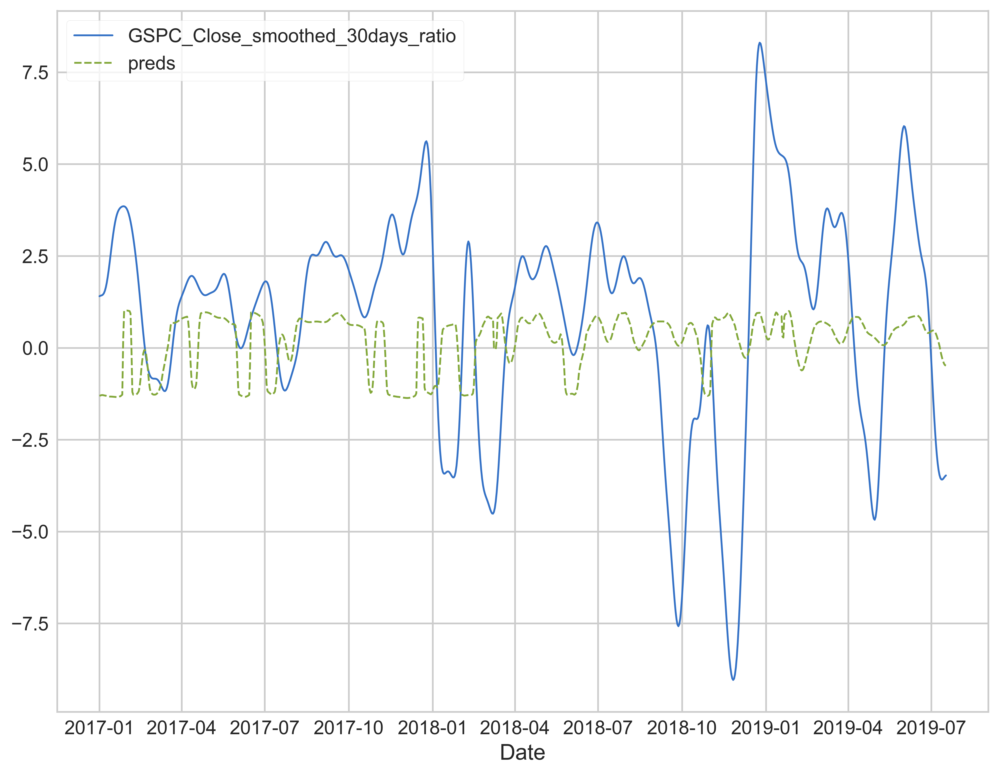

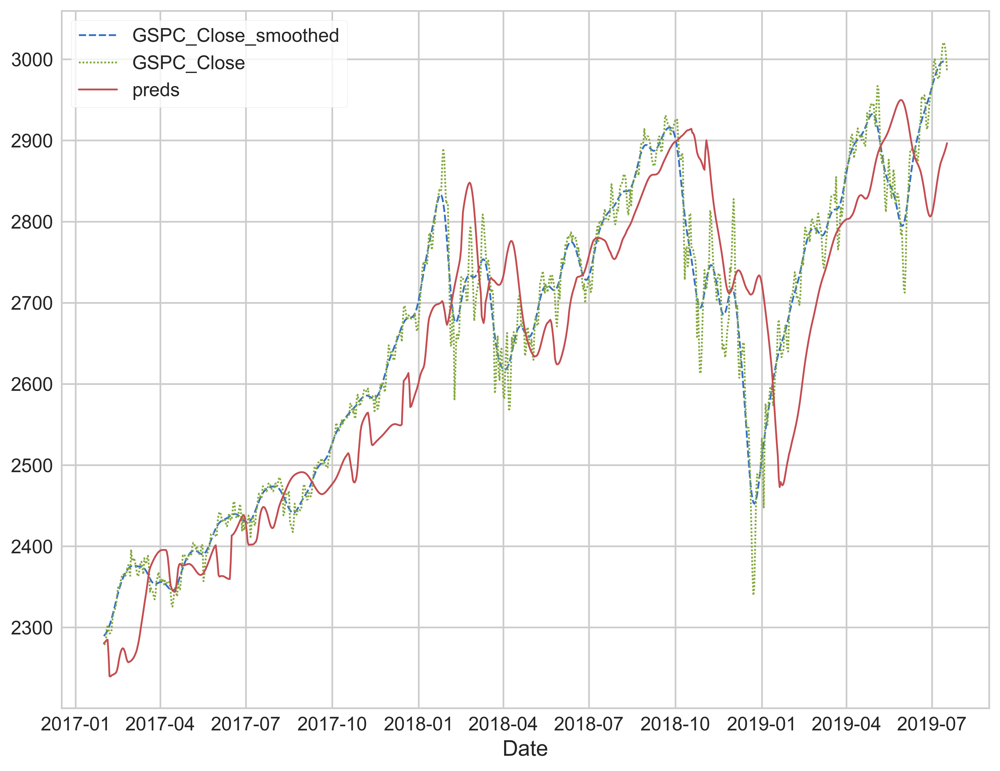

Prediction is 0.5005574136009159 days behind reference


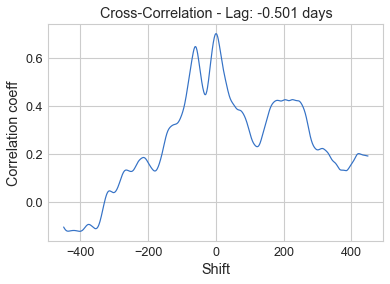


For major peaks in the index:

The average delay around the peaks are 2.5 days
The median delay around the peaks are 1.0 days


,Days Delayed
2017-04-10,-9.0
2017-05-01,-9.0
2017-05-22,8.0
2017-07-03,-5.0
2017-09-03,-11.0
2017-09-28,20.0
2017-11-18,-11.0
2017-12-26,-5.0
2018-01-18,1.0
2018-02-10,14.0


In [16]:
plot_results(mlp_sklearn_model,X_valid, y_valid, start_time='2017-01-01', end_time='2020-01-03')

Epoch 1/500
3/3 [==============================] - 3s 271ms/step - loss: 3.0923 - mae: 3.0923 - val_loss: 15.2944 - val_mae: 15.2944
Epoch 2/500
3/3 [==============================] - 0s 40ms/step - loss: 3.0246 - mae: 3.0246 - val_loss: 6.5239 - val_mae: 6.5239
Epoch 3/500
3/3 [==============================] - 0s 36ms/step - loss: 3.0086 - mae: 3.0086 - val_loss: 6.5410 - val_mae: 6.5410
Epoch 4/500
3/3 [==============================] - 0s 36ms/step - loss: 2.9690 - mae: 2.9690 - val_loss: 7.1780 - val_mae: 7.1780
Epoch 5/500
3/3 [==============================] - 0s 36ms/step - loss: 2.9534 - mae: 2.9534 - val_loss: 5.3568 - val_mae: 5.3568
Epoch 6/500
3/3 [==============================] - 0s 79ms/step - loss: 2.9373 - mae: 2.9373 - val_loss: 5.9780 - val_mae: 5.9780
Epoch 7/500
3/3 [==============================] - 0s 37ms/step - loss: 2.9301 - mae: 2.9301 - val_loss: 6.2868 - val_mae: 6.2868
Epoch 8/500
3/3 [==============================] - 0s 37ms/step - loss: 2.9327 - mae: 2

3/3 [==============================] - 0s 35ms/step - loss: 2.7465 - mae: 2.7465 - val_loss: 4.3318 - val_mae: 4.3318
Epoch 64/500
3/3 [==============================] - 0s 36ms/step - loss: 2.7235 - mae: 2.7235 - val_loss: 4.3118 - val_mae: 4.3118
Epoch 65/500
3/3 [==============================] - 0s 38ms/step - loss: 2.7259 - mae: 2.7259 - val_loss: 5.0927 - val_mae: 5.0927
Epoch 66/500
3/3 [==============================] - 0s 40ms/step - loss: 2.7521 - mae: 2.7521 - val_loss: 5.8095 - val_mae: 5.8095
Epoch 67/500
3/3 [==============================] - 0s 37ms/step - loss: 2.7215 - mae: 2.7215 - val_loss: 4.7946 - val_mae: 4.7946
Epoch 68/500
3/3 [==============================] - 0s 39ms/step - loss: 2.7172 - mae: 2.7172 - val_loss: 5.0217 - val_mae: 5.0217
Epoch 69/500
3/3 [==============================] - 0s 38ms/step - loss: 2.7321 - mae: 2.7321 - val_loss: 6.1615 - val_mae: 6.1615
Epoch 70/500
3/3 [==============================] - 0s 34ms/step - loss: 2.7107 - mae: 2.7107 - 

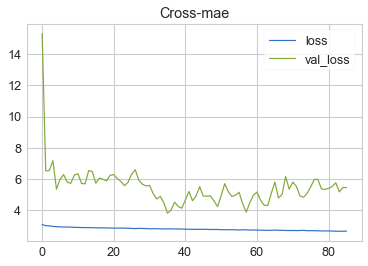

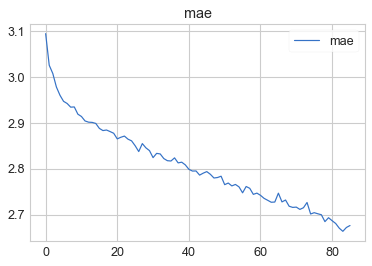

In [17]:
mlp_tf_model = keras.Sequential([
    layers.Dense(256, activation='relu',input_shape=[X_train.shape[1]]),   
    layers.BatchNormalization(),
    layers.Dropout(0.3),
    layers.Dense(256),   
    layers.BatchNormalization(),
    layers.LeakyReLU(),
    layers.Dropout(0.3),
    layers.Dense(256),   
    layers.BatchNormalization(),
    layers.LeakyReLU(),
    layers.Dropout(0.3),
    layers.Dense(256),   
    layers.BatchNormalization(),
    layers.LeakyReLU(),
    layers.Dropout(0.3),
    layers.Dense(256),     
    layers.BatchNormalization(),
    layers.LeakyReLU(),
    layers.Dense(1),
    layers.LeakyReLU(),
])


# mlp_tf_model = keras.Sequential([
#     layers.Dense(28, activation='relu',input_shape=[X_train.shape[1]]),
#     layers.BatchNormalization(),
#     layers.Dense(64, activation='relu',input_shape=[X_train.shape[1]]),   
#     layers.BatchNormalization(),
#     layers.Dense(128, activation='relu'), 
#     layers.BatchNormalization(),
#     layers.Dense(256), 
#     layers.LeakyReLU(),
#     layers.BatchNormalization(),
#     layers.Dense(256), 
#     layers.LeakyReLU(),
#     layers.BatchNormalization(),
#     layers.Dense(256), 
#     layers.LeakyReLU(),
#     layers.BatchNormalization(),
#     layers.Dense(256), 
#     layers.LeakyReLU(),
#     layers.BatchNormalization(),
#     layers.Dense(256), 
#     layers.LeakyReLU(),
#     layers.BatchNormalization(),
#     layers.Dense(256), 
#     layers.LeakyReLU(),
#     layers.BatchNormalization(),
#     layers.Dense(1, activation='relu'),
# ])

# mlp_tf_model = keras.Sequential([
#     layers.Dense(28, activation='relu',input_shape=[X_train.shape[1]]),   
#     layers.Dense(14, activation='relu'), 
#     layers.Dense(14, activation='relu'), 
#     layers.Dense(7, activation='relu'), 
#     layers.Dense(7, activation='relu'),
#     layers.Dense(7, activation='relu'),
#     layers.Dense(7, activation='relu'),
#     layers.Dense(7, activation='relu'),
#     layers.Dense(7, activation='relu'),
#     layers.Dense(7, activation='relu'),
#     layers.Dense(7, activation='relu'),
#     layers.Dense(7, activation='relu'),
#     layers.Dense(7, activation='relu'),
#     layers.Dense(7, activation='relu'),
#     layers.Dense(7, activation='relu'),
#     layers.Dense(7, activation='relu'),
#     layers.Dense(7, activation='relu'),
#     layers.Dense(7, activation='relu'),
#     layers.Dense(7, activation='relu'),
#     layers.Dense(3, activation='relu'),
#     layers.Dense(3, activation='relu'),
#     layers.Dense(1, activation='relu'),
# ])

mlp_tf_model.compile(
    optimizer='adam',
    loss='mae',
     metrics=['mae'],
)

early_stopping = keras.callbacks.EarlyStopping(
    patience=50,
    min_delta=0.0001,
    restore_best_weights=True,
)

history = mlp_tf_model.fit(
    X_train, y_train,
    validation_data=(X_valid, y_valid),
    batch_size=365*10,
    epochs=500,
    callbacks=[early_stopping]
)

history_df = pd.DataFrame(history.history)
history_df.loc[:, ['loss', 'val_loss']].plot(title="Cross-mae")
history_df.loc[:, ['mae']].plot(title="mae")
print(("Minimum Validation Loss: {:0.4f}").format(history_df['val_loss'].min()))
print(f'Model test accuracy: {history_df["mae"].max():.3f}')

The absolut error is 4.359%
116.96760656705942


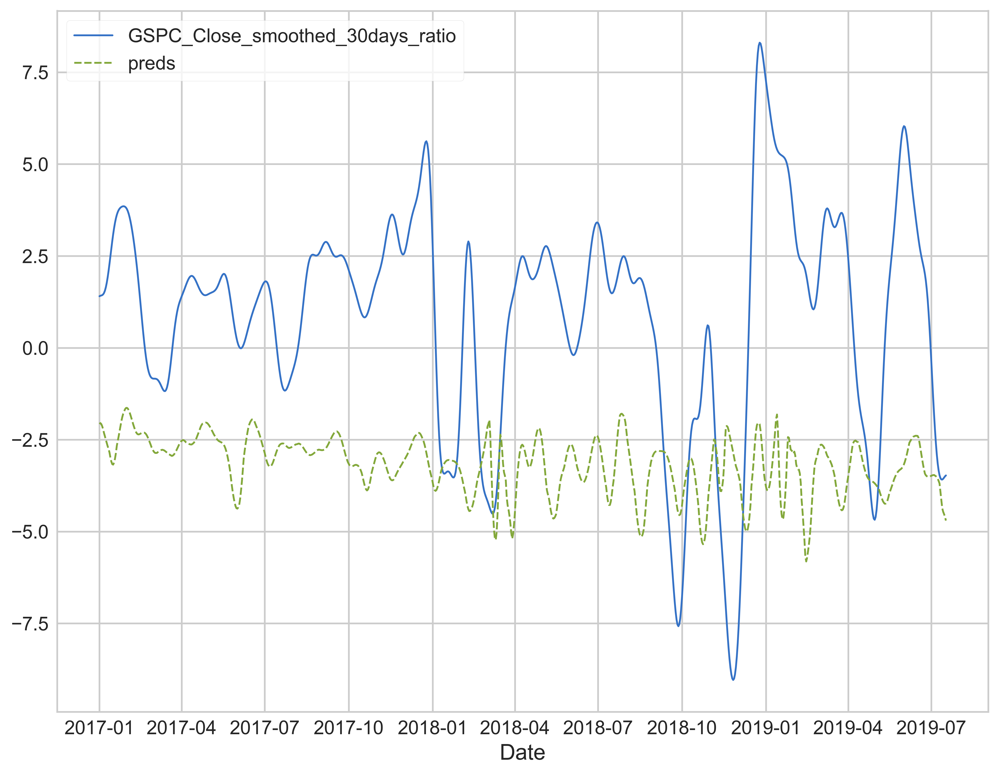

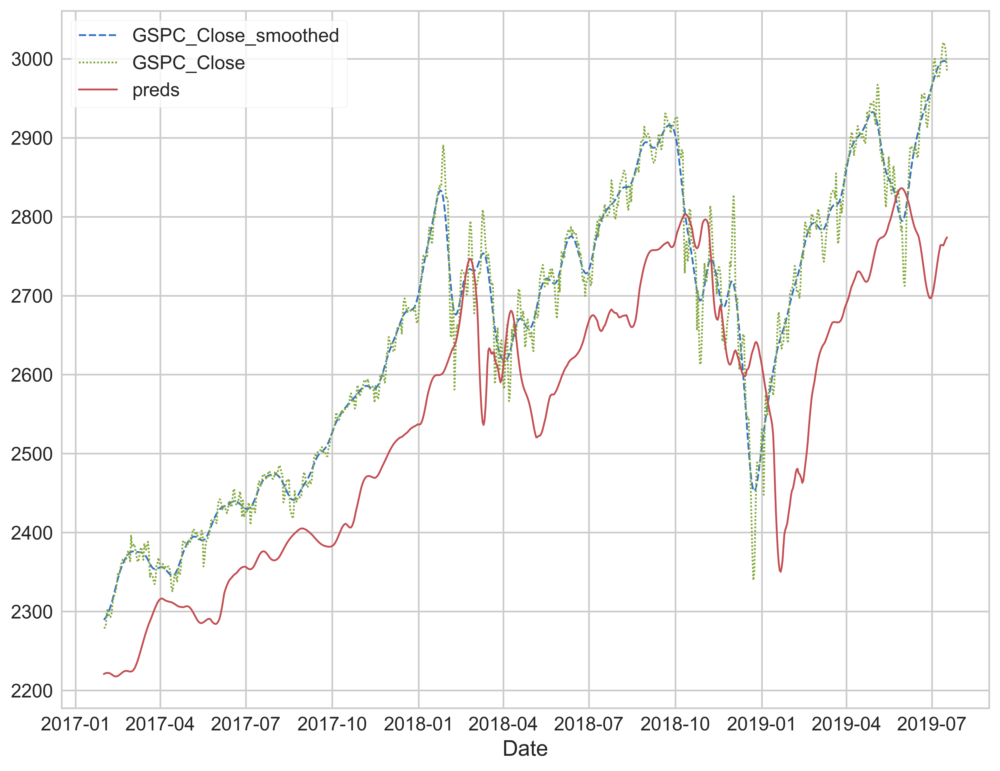

Prediction is -0.500557413600859 days behind reference


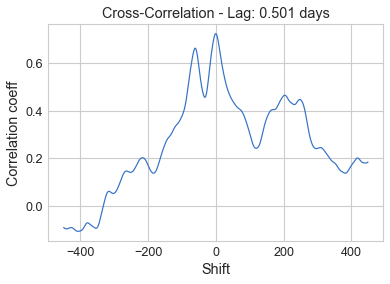


For major peaks in the index:

The average delay around the peaks are 1.294 days
The median delay around the peaks are 0.0 days


,Days Delayed
2017-04-10,-8.0
2017-05-22,-1.0
2017-07-03,-6.0
2017-09-03,-6.0
2017-09-28,17.0
2017-11-18,-11.0
2017-12-26,5.0
2018-01-18,1.0
2018-02-10,14.0
2018-04-09,0.0


In [18]:
plot_results(mlp_tf_model,X_valid, y_valid, start_time='2017-01-01', end_time='2020-01-03')

In [19]:
def dnn_prepare(df, length):
    output=[]
    df_vals=df.values
    for i in range(length, df_vals.shape[0]):
        output.append(df_vals[i-length:i])
    output = np.array(output)

    return output

train_X_dnn = dnn_prepare(X_train,prediction_distance*2)
y_train_dnn = y_train[prediction_distance*2:]

valid_X_dnn = dnn_prepare(X_valid,prediction_distance*2)
y_valid_dnn = y_valid[prediction_distance*2:]

val_X_dnn = dnn_prepare(X_val,prediction_distance*2)
y_val_dnn = y_val[prediction_distance*2:]

test_X_dnn = dnn_prepare(X_test,prediction_distance*2)
y_test_dnn = y_test[prediction_distance*2:]

In [20]:
# lstm_prepare(X_train,60).shape

Epoch 1/2000
6/6 [==============================] - 6s 134ms/step - loss: 3.1669 - mae: 3.1669 - val_loss: 2.1855 - val_mae: 2.1855
Epoch 2/2000
6/6 [==============================] - 0s 33ms/step - loss: 3.0622 - mae: 3.0622 - val_loss: 2.1567 - val_mae: 2.1567
Epoch 3/2000
6/6 [==============================] - 0s 27ms/step - loss: 3.0146 - mae: 3.0146 - val_loss: 2.1554 - val_mae: 2.1554
Epoch 4/2000
6/6 [==============================] - 0s 28ms/step - loss: 3.0056 - mae: 3.0056 - val_loss: 2.1485 - val_mae: 2.1485
Epoch 5/2000
6/6 [==============================] - 0s 27ms/step - loss: 3.0135 - mae: 3.0135 - val_loss: 2.1483 - val_mae: 2.1483
Epoch 6/2000
6/6 [==============================] - 0s 29ms/step - loss: 3.0187 - mae: 3.0187 - val_loss: 2.1482 - val_mae: 2.1482
Epoch 7/2000
6/6 [==============================] - 0s 29ms/step - loss: 3.0174 - mae: 3.0174 - val_loss: 2.1468 - val_mae: 2.1468
Epoch 8/2000
6/6 [==============================] - 0s 28ms/step - loss: 3.0327 - 

6/6 [==============================] - 0s 27ms/step - loss: 3.0357 - mae: 3.0357 - val_loss: 2.1460 - val_mae: 2.1460
Epoch 64/2000
6/6 [==============================] - 0s 26ms/step - loss: 3.0430 - mae: 3.0430 - val_loss: 2.1288 - val_mae: 2.1288
Epoch 65/2000
6/6 [==============================] - 0s 28ms/step - loss: 3.0296 - mae: 3.0296 - val_loss: 2.1253 - val_mae: 2.1253
Epoch 66/2000
6/6 [==============================] - 0s 26ms/step - loss: 3.0318 - mae: 3.0318 - val_loss: 2.1326 - val_mae: 2.1326
Epoch 67/2000
6/6 [==============================] - 0s 26ms/step - loss: 3.0055 - mae: 3.0055 - val_loss: 2.1427 - val_mae: 2.1427
Epoch 68/2000
6/6 [==============================] - 0s 26ms/step - loss: 3.0321 - mae: 3.0321 - val_loss: 2.1376 - val_mae: 2.1376
Epoch 69/2000
6/6 [==============================] - 0s 25ms/step - loss: 3.0191 - mae: 3.0191 - val_loss: 2.1278 - val_mae: 2.1278
Epoch 70/2000
6/6 [==============================] - 0s 27ms/step - loss: 3.0154 - mae: 3.

Epoch 125/2000
6/6 [==============================] - 0s 26ms/step - loss: 2.9985 - mae: 2.9985 - val_loss: 2.1259 - val_mae: 2.1259
Epoch 126/2000
6/6 [==============================] - 0s 26ms/step - loss: 3.0160 - mae: 3.0160 - val_loss: 2.1181 - val_mae: 2.1181
Epoch 127/2000
6/6 [==============================] - 0s 27ms/step - loss: 3.0545 - mae: 3.0545 - val_loss: 2.1260 - val_mae: 2.1260
Epoch 128/2000
6/6 [==============================] - 0s 27ms/step - loss: 2.9980 - mae: 2.9980 - val_loss: 2.1267 - val_mae: 2.1267
Epoch 129/2000
6/6 [==============================] - 0s 27ms/step - loss: 3.0003 - mae: 3.0003 - val_loss: 2.1032 - val_mae: 2.1032
Epoch 130/2000
6/6 [==============================] - 0s 29ms/step - loss: 3.0208 - mae: 3.0208 - val_loss: 2.0639 - val_mae: 2.0639
Epoch 131/2000
6/6 [==============================] - 0s 28ms/step - loss: 2.9991 - mae: 2.9991 - val_loss: 2.0630 - val_mae: 2.0630
Epoch 132/2000
6/6 [==============================] - 0s 26ms/step - 

6/6 [==============================] - 0s 29ms/step - loss: 3.0174 - mae: 3.0174 - val_loss: 2.1184 - val_mae: 2.1184
Epoch 187/2000
6/6 [==============================] - 0s 30ms/step - loss: 3.0203 - mae: 3.0203 - val_loss: 2.0913 - val_mae: 2.0913
Epoch 188/2000
6/6 [==============================] - 0s 28ms/step - loss: 2.9909 - mae: 2.9909 - val_loss: 2.0565 - val_mae: 2.0565
Epoch 189/2000
6/6 [==============================] - 0s 47ms/step - loss: 3.0074 - mae: 3.0074 - val_loss: 2.0458 - val_mae: 2.0458
Epoch 190/2000
6/6 [==============================] - 0s 28ms/step - loss: 2.9990 - mae: 2.9990 - val_loss: 2.0501 - val_mae: 2.0501
Epoch 191/2000
6/6 [==============================] - 0s 30ms/step - loss: 2.9861 - mae: 2.9861 - val_loss: 2.0686 - val_mae: 2.0686
Epoch 192/2000
6/6 [==============================] - 0s 29ms/step - loss: 2.9923 - mae: 2.9923 - val_loss: 2.0512 - val_mae: 2.0512
Epoch 193/2000
6/6 [==============================] - 0s 29ms/step - loss: 3.0208 - 

Epoch 248/2000
6/6 [==============================] - 0s 27ms/step - loss: 2.9998 - mae: 2.9998 - val_loss: 2.0727 - val_mae: 2.0727
Epoch 249/2000
6/6 [==============================] - 0s 27ms/step - loss: 2.9985 - mae: 2.9985 - val_loss: 2.0680 - val_mae: 2.0680
Epoch 250/2000
6/6 [==============================] - 0s 27ms/step - loss: 3.0013 - mae: 3.0013 - val_loss: 2.0728 - val_mae: 2.0728
Epoch 251/2000
6/6 [==============================] - 0s 48ms/step - loss: 2.9892 - mae: 2.9892 - val_loss: 2.0680 - val_mae: 2.0680
Epoch 252/2000
6/6 [==============================] - 0s 29ms/step - loss: 3.0323 - mae: 3.0323 - val_loss: 2.0708 - val_mae: 2.0708
Epoch 253/2000
6/6 [==============================] - 0s 26ms/step - loss: 3.0140 - mae: 3.0140 - val_loss: 2.0714 - val_mae: 2.0714
Epoch 254/2000
6/6 [==============================] - 0s 26ms/step - loss: 2.9908 - mae: 2.9908 - val_loss: 2.0696 - val_mae: 2.0696
Epoch 255/2000
6/6 [==============================] - 0s 26ms/step - 

6/6 [==============================] - 0s 27ms/step - loss: 3.0411 - mae: 3.0411 - val_loss: 2.0394 - val_mae: 2.0394
Epoch 310/2000
6/6 [==============================] - 0s 30ms/step - loss: 2.9922 - mae: 2.9922 - val_loss: 2.0422 - val_mae: 2.0422
Epoch 311/2000
6/6 [==============================] - 0s 35ms/step - loss: 2.9986 - mae: 2.9986 - val_loss: 2.0453 - val_mae: 2.0453
Epoch 312/2000
6/6 [==============================] - 0s 31ms/step - loss: 2.9832 - mae: 2.9832 - val_loss: 2.0319 - val_mae: 2.0319
Epoch 313/2000
6/6 [==============================] - 0s 34ms/step - loss: 2.9957 - mae: 2.9957 - val_loss: 2.0370 - val_mae: 2.0370
Epoch 314/2000
6/6 [==============================] - 0s 32ms/step - loss: 2.9756 - mae: 2.9756 - val_loss: 2.0364 - val_mae: 2.0364
Epoch 315/2000
6/6 [==============================] - 0s 56ms/step - loss: 3.0035 - mae: 3.0035 - val_loss: 2.0324 - val_mae: 2.0324
Epoch 316/2000
6/6 [==============================] - 0s 29ms/step - loss: 2.9859 - 

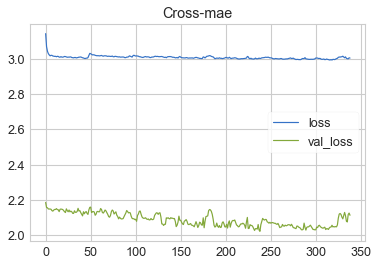

In [21]:


# design network
LSTM_model = keras.Sequential([
    # Note: wider LSTM would improve the result, but I'm often hardware constrained   
    layers.LSTM(64, input_shape=(train_X_dnn.shape[1], train_X_dnn.shape[2]), return_sequences=False),  
#     layers.BatchNormalization(),
#     layers.Dropout(0.3),
#     layers.Dense(128),   
#     layers.BatchNormalization(),
#     layers.LeakyReLU(),
#     layers.Dropout(0.3),
#     layers.Dense(16),   
#     layers.BatchNormalization(),
#     layers.LeakyReLU(),
#     layers.Dropout(0.3),
#     layers.Dense(256),   
#     layers.BatchNormalization(),
#     layers.LeakyReLU(),
#     layers.Dropout(0.3),
#     layers.Dense(256),     
#     layers.BatchNormalization(),
#     layers.LeakyReLU(),
    layers.Dense(1),
#     layers.LeakyReLU(),
])

# LSTM_model = keras.Sequential([
#     layers.LSTM(32, input_shape=(train_X_dnn.shape[1], train_X_dnn.shape[2]), return_sequences=False),  
#     layers.BatchNormalization(),
#     layers.Dropout(0.3),
#     layers.Dense(32),   
#     layers.BatchNormalization(),
#     layers.LeakyReLU(),
#     layers.Dropout(0.3),
#     layers.Dense(16),   
#     layers.BatchNormalization(),
#     layers.LeakyReLU(),
#     layers.Dropout(0.3),
#     layers.Dense(16),   
#     layers.BatchNormalization(),
#     layers.LeakyReLU(),
#     layers.Dropout(0.3),
# #     layers.Dense(256),     
# #     layers.BatchNormalization(),
# #     layers.LeakyReLU(),
#     layers.Dense(1),
#     layers.LeakyReLU(),
# ])

LSTM_model.compile(
    optimizer='adam',
    loss='mae',
     metrics=['mae'],
)

# fit network
# history = LSTM_model.fit(train_X, y_train, epochs=50, batch_size=72, validation_data=(test_X, y_test), verbose=2, shuffle=False)
early_stopping = keras.callbacks.EarlyStopping(
    patience=100,
    min_delta=0.0001,
    restore_best_weights=True,
)

history = LSTM_model.fit(
    train_X_dnn, y_train_dnn,
    validation_data=(val_X_dnn, y_val_dnn),
    batch_size=365*5,
    epochs=2000,
    callbacks=[early_stopping]
)

# plot history
history_df = pd.DataFrame(history.history)
history_df.loc[:, ['loss', 'val_loss']].plot(title="Cross-mae")
print(("Minimum Validation Loss: {:0.4f}").format(history_df['val_loss'].min()))




In [22]:
lstm_preds=LSTM_model.predict(test_X_dnn)
lstm_score = mean_absolute_error(y_test_dnn, lstm_preds)
print(f"Test mae = {round(lstm_score,4)}")

Test mae = 2.1339


The absolut error is 2.275%
60.90798031629875


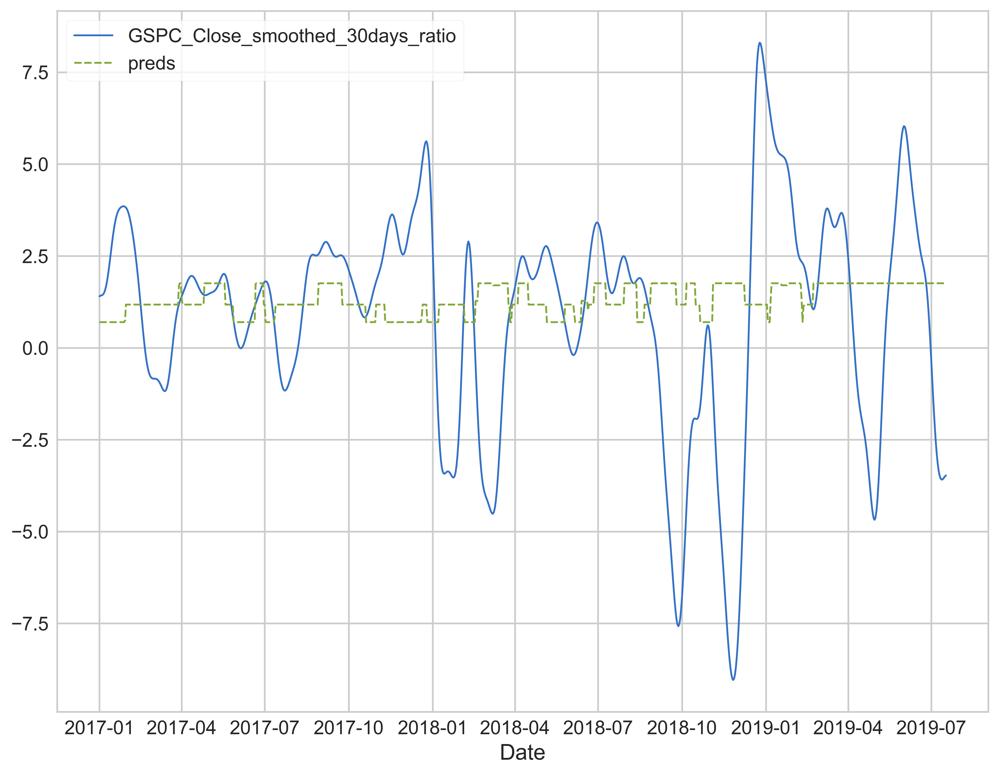

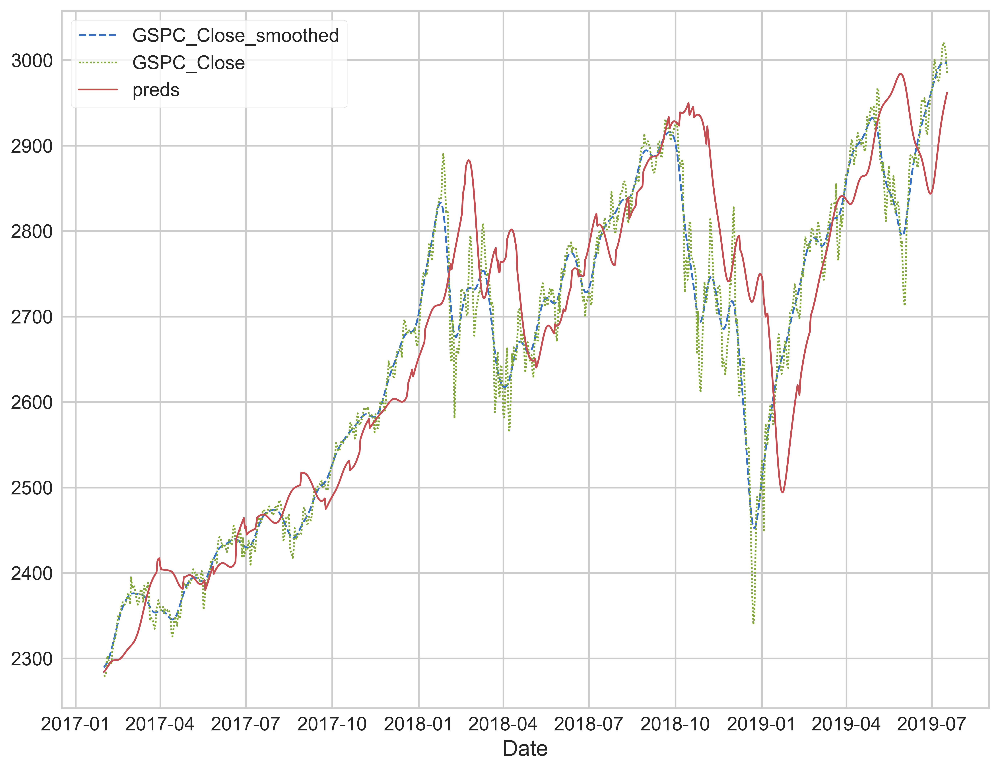

Prediction is 1.5016722408026908 days behind reference


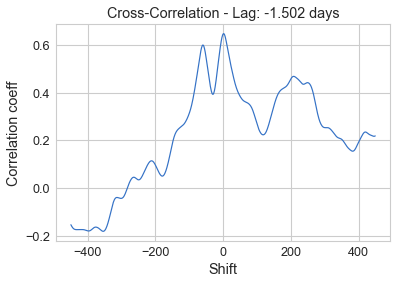


For major peaks in the index:

The average delay around the peaks are -0.389 days
The median delay around the peaks are -0.5 days


,Days Delayed
2017-04-10,-11.0
2017-05-01,-5.0
2017-05-22,5.0
2017-07-03,-4.0
2017-09-03,-5.0
2017-09-28,21.0
2017-11-18,-9.0
2017-12-26,-1.0
2018-01-18,0.0
2018-02-10,-6.0


In [23]:
plot_results(LSTM_model,test_X_dnn, y_test_dnn, start_time='2017-01-01', end_time='2020-01-03')

Epoch 1/500
6/6 [==============================] - 8s 252ms/step - loss: 3.1017 - mae: 3.1017 - val_loss: 18.8889 - val_mae: 18.8889
Epoch 2/500
6/6 [==============================] - 0s 33ms/step - loss: 3.0370 - mae: 3.0370 - val_loss: 17.8304 - val_mae: 17.8304
Epoch 3/500
6/6 [==============================] - 0s 33ms/step - loss: 2.9915 - mae: 2.9915 - val_loss: 16.1528 - val_mae: 16.1528
Epoch 4/500
6/6 [==============================] - 0s 34ms/step - loss: 2.9676 - mae: 2.9676 - val_loss: 13.3124 - val_mae: 13.3124
Epoch 5/500
6/6 [==============================] - 0s 32ms/step - loss: 2.9576 - mae: 2.9576 - val_loss: 11.6968 - val_mae: 11.6968
Epoch 6/500
6/6 [==============================] - 0s 33ms/step - loss: 2.9275 - mae: 2.9275 - val_loss: 9.2015 - val_mae: 9.2015
Epoch 7/500
6/6 [==============================] - 0s 33ms/step - loss: 2.9011 - mae: 2.9011 - val_loss: 6.9513 - val_mae: 6.9513
Epoch 8/500
6/6 [==============================] - 0s 33ms/step - loss: 2.8823 

6/6 [==============================] - 0s 31ms/step - loss: 2.4715 - mae: 2.4715 - val_loss: 3.2962 - val_mae: 3.2962
Epoch 64/500
6/6 [==============================] - 0s 30ms/step - loss: 2.4667 - mae: 2.4667 - val_loss: 3.8998 - val_mae: 3.8998
Epoch 65/500
6/6 [==============================] - 0s 30ms/step - loss: 2.5298 - mae: 2.5298 - val_loss: 3.3931 - val_mae: 3.3931
Epoch 66/500
6/6 [==============================] - 0s 30ms/step - loss: 2.5582 - mae: 2.5582 - val_loss: 5.7230 - val_mae: 5.7230
Epoch 67/500
6/6 [==============================] - 0s 30ms/step - loss: 2.5678 - mae: 2.5678 - val_loss: 3.7786 - val_mae: 3.7786
Epoch 68/500
6/6 [==============================] - 0s 29ms/step - loss: 2.5202 - mae: 2.5202 - val_loss: 4.3222 - val_mae: 4.3222
Epoch 69/500
6/6 [==============================] - 0s 32ms/step - loss: 2.4932 - mae: 2.4932 - val_loss: 4.4321 - val_mae: 4.4321
Epoch 70/500
6/6 [==============================] - 0s 32ms/step - loss: 2.4958 - mae: 2.4958 - 

6/6 [==============================] - ETA: 0s - loss: 2.2264 - mae: 2.226 - 0s 35ms/step - loss: 2.2205 - mae: 2.2205 - val_loss: 5.3882 - val_mae: 5.3882
Epoch 126/500
6/6 [==============================] - 0s 54ms/step - loss: 2.1913 - mae: 2.1913 - val_loss: 5.5507 - val_mae: 5.5507
Epoch 127/500
6/6 [==============================] - 0s 33ms/step - loss: 2.1905 - mae: 2.1905 - val_loss: 5.0552 - val_mae: 5.0552
Epoch 128/500
6/6 [==============================] - 0s 30ms/step - loss: 2.1584 - mae: 2.1584 - val_loss: 4.8558 - val_mae: 4.8558
Epoch 129/500
6/6 [==============================] - 0s 33ms/step - loss: 2.2119 - mae: 2.2119 - val_loss: 4.3259 - val_mae: 4.3259
Epoch 130/500
6/6 [==============================] - 0s 31ms/step - loss: 2.2228 - mae: 2.2228 - val_loss: 5.1900 - val_mae: 5.1900
Epoch 131/500
6/6 [==============================] - 0s 38ms/step - loss: 2.1736 - mae: 2.1736 - val_loss: 5.0455 - val_mae: 5.0455
Epoch 132/500
6/6 [==============================] -

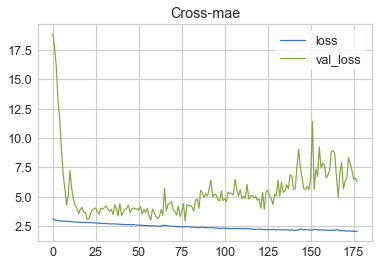

In [24]:
# design network

cnn_model = keras.Sequential([
    layers.Conv1D(filters=64, kernel_size=int(prediction_distance/2), activation='relu', input_shape=(train_X_dnn.shape[1],train_X_dnn.shape[2])), 
    layers.MaxPooling1D(pool_size=2),
    layers.Flatten(),
    layers.BatchNormalization(),
    layers.Dropout(0.3),
    layers.Dense(64),   
    layers.BatchNormalization(),
    layers.LeakyReLU(),
    layers.Dropout(0.3),
    layers.Dense(64),   
    layers.BatchNormalization(),
    layers.LeakyReLU(),
    layers.Dropout(0.3),
#     layers.Dense(32),   
#     layers.BatchNormalization(),
#     layers.LeakyReLU(),
#     layers.Dropout(0.3),
    layers.Dense(32),     
    layers.BatchNormalization(),
    layers.LeakyReLU(),
    layers.Dense(1),
    layers.LeakyReLU(),
]) #0.6251


cnn_model.compile(
    optimizer='adam',
    loss='mae',
     metrics=['mae'],
)

# fit network
# history = LSTM_model.fit(train_X, y_train, epochs=50, batch_size=72, validation_data=(test_X, y_test), verbose=2, shuffle=False)

early_stopping = keras.callbacks.EarlyStopping(
    patience=100,
    min_delta=0.00005,
    restore_best_weights=True,
)

cnn_history = cnn_model.fit(
    train_X_dnn, y_train_dnn,
    validation_data=(val_X_dnn, y_val_dnn),
    batch_size=365*5,
    epochs=500,
    callbacks=[early_stopping]
)

# plot history
cnn_history_df = pd.DataFrame(cnn_history.history)
cnn_history_df.loc[:, ['loss', 'val_loss']].plot(title="Cross-mae")

print(("Minimum Validation Loss: {:0.4f}").format(cnn_history_df['val_loss'].min()))


In [25]:
cnn_preds=cnn_model.predict(test_X_dnn)
cnn_score = mean_absolute_error(y_test_dnn, cnn_preds)
print(f"Test mae = {round(cnn_score,4)}")

Test mae = 5.275


The absolut error is 5.537%
149.61324428802527


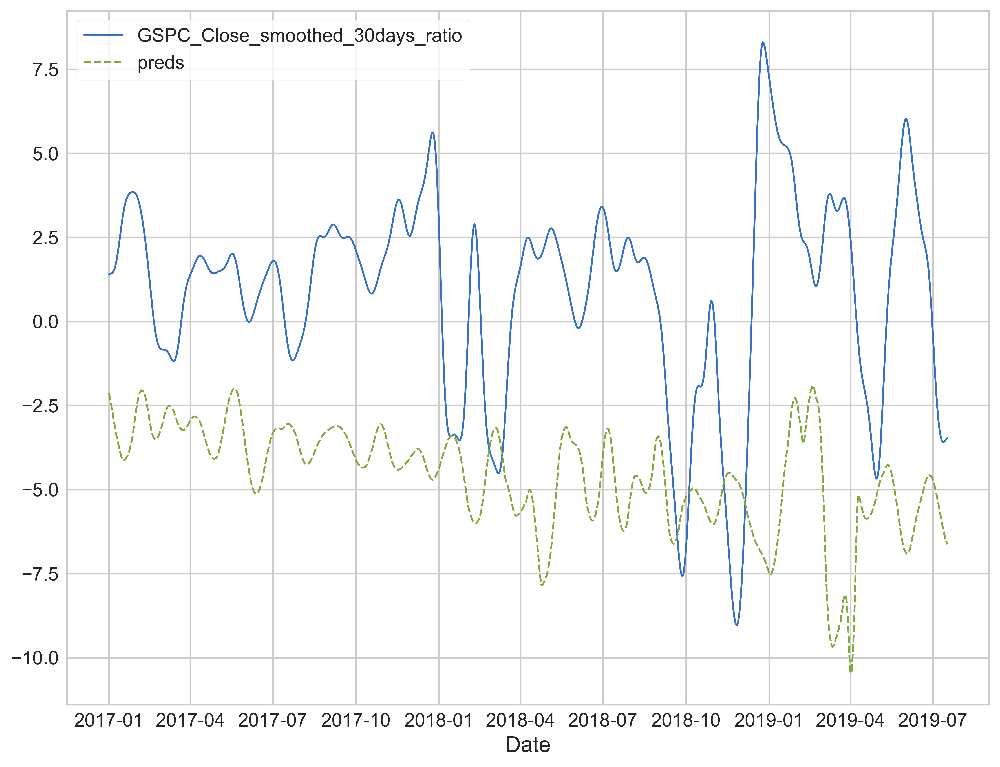

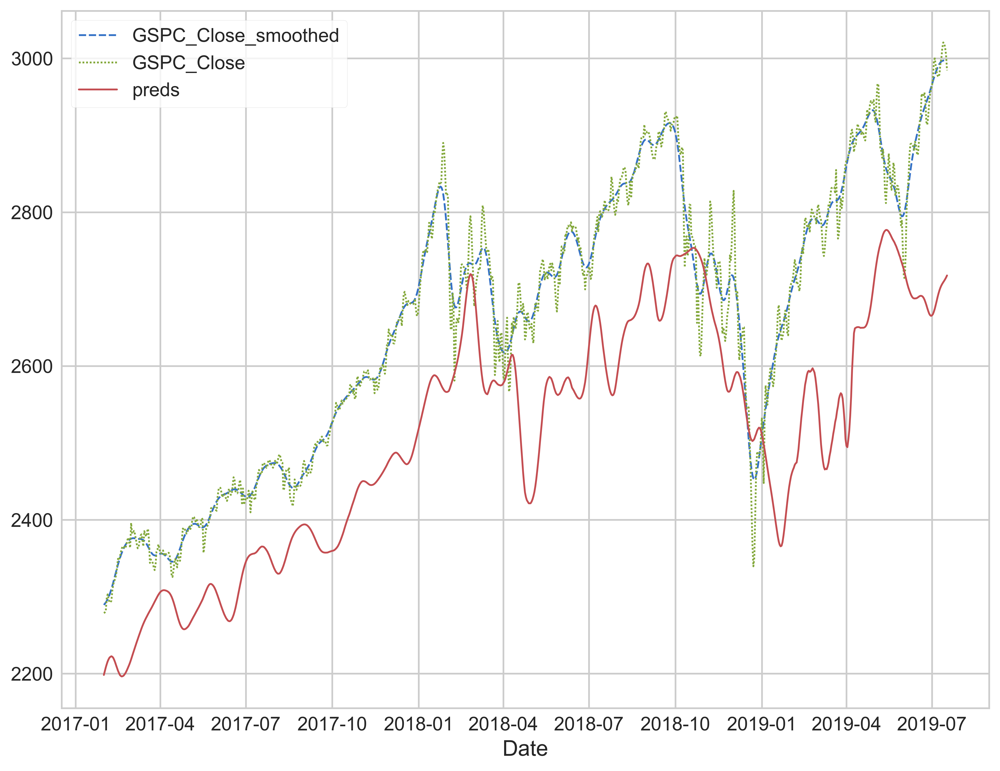

Prediction is -54.56075808249716 days behind reference


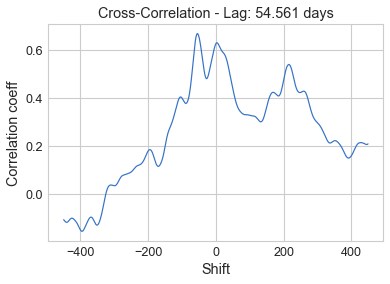


For major peaks in the index:

The average delay around the peaks are -2.25 days
The median delay around the peaks are 0.0 days


,Days Delayed
2017-04-10,-7.0
2017-05-22,2.0
2017-07-03,15.0
2017-09-03,-4.0
2017-11-18,-16.0
2017-12-26,-19.0
2018-01-18,-1.0
2018-02-10,15.0
2018-04-09,1.0
2018-05-15,5.0


In [26]:
plot_results(cnn_model,test_X_dnn, y_test_dnn)